 PIPELINE — Modelado Territorial Educación Superior — PY

[1/6] Leyendo archivos de entrada...
   Proporción nacional 15–29 (Censo 2022): 0.2551
   Registros CONES (raw): 27,924

[2/6] Procesando oferta educativa...
   Departamentos con oferta registrada: 18

[3/6] Estimando demanda potencial y proyección...

[4/6] Calculando índices de cobertura territorial...

[5/6] Ejecutando clustering territorial (K-means)...


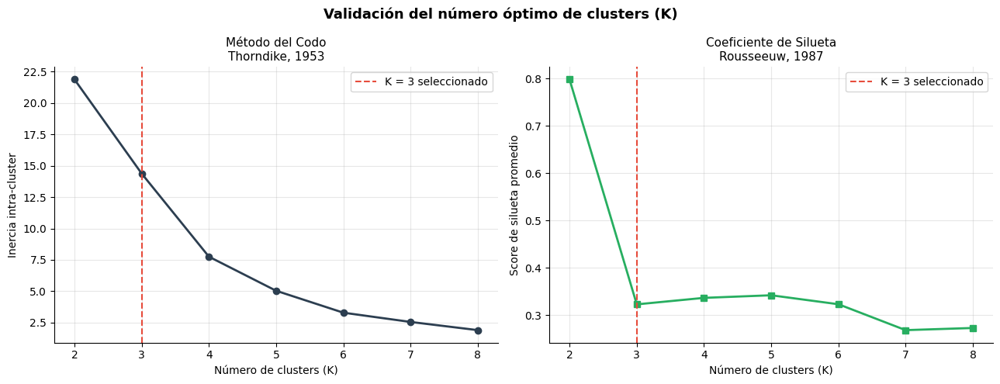

   K óptimo por silueta: 2 | K seleccionado: 3 | Silueta en K=3: 0.322

[5.1/6] Calculando Índice de Prioridad Territorial Educativa (IPTE)...
   IPTE calculado correctamente.

Ranking IPTE:


,RANK_IPTE,DPTO_NORM,IPTE,COBERTURA_N,PERTINENCIA_N,CRECIMIENTO_N,IDX_PRES_x10K,SCORE_PERTINENCIA,PRIORIDAD
0,1,PRESIDENTE HAYES,0.671,0.948,1.000,0.065,32.746,0.000,ALTA (Suboferta)
1,2,ALTO PARAGUAY,0.670,1.000,1.000,0.009,4.560,0.000,ALTA (Suboferta)
2,3,CENTRAL,0.661,0.920,0.063,1.000,47.613,0.750,MEDIA
3,4,ALTO PARANA,0.660,0.889,0.688,0.405,64.886,0.250,MEDIA
4,5,BOQUERON,0.633,0.862,1.000,0.038,79.425,0.000,ALTA (Suboferta)
5,6,NEEMBUCU,0.630,0.848,1.000,0.041,86.871,0.000,ALTA (Suboferta)
6,7,MISIONES,0.615,0.786,1.000,0.059,120.284,0.000,ALTA (Suboferta)
7,8,SAN PEDRO,0.589,0.891,0.688,0.189,63.358,0.250,ALTA (Suboferta)
8,9,CAAGUAZU,0.589,0.849,0.688,0.229,86.218,0.250,MEDIA
9,10,CANINDEYU,0.581,0.953,0.688,0.101,29.950,0.250,ALTA (Suboferta)



[6/6] Generando outputs...
   CSVs exportados.


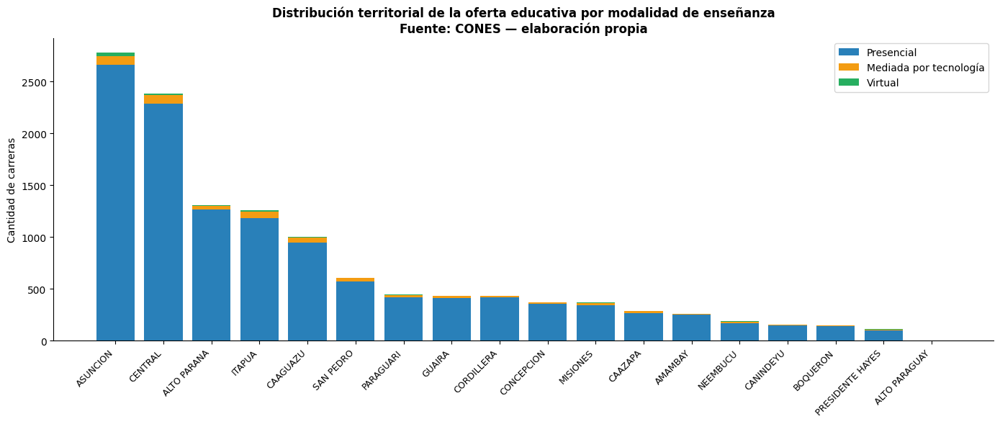

   Guardado: fig1_oferta_modalidades.png


/tmp/ipykernel_6414/3894974972.py:591: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(d["DPTO_NORM"], rotation=45, ha="right", fontsize=9)


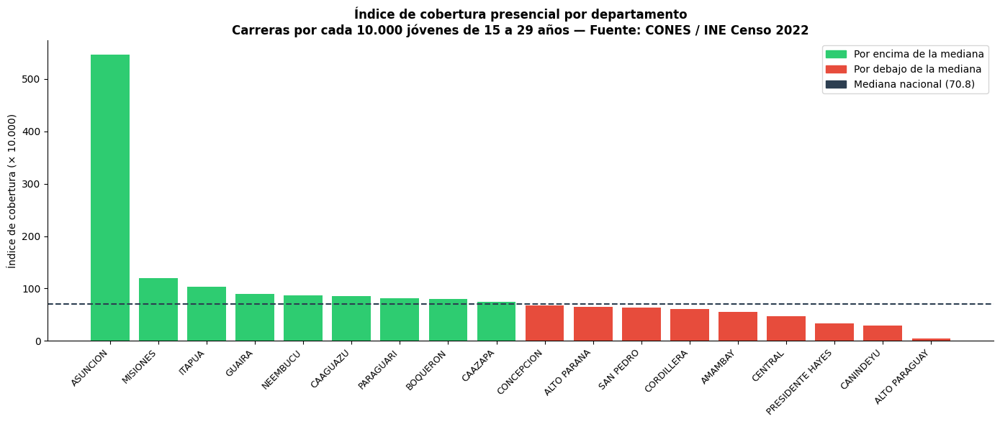

   Guardado: fig2_cobertura_presencial.png


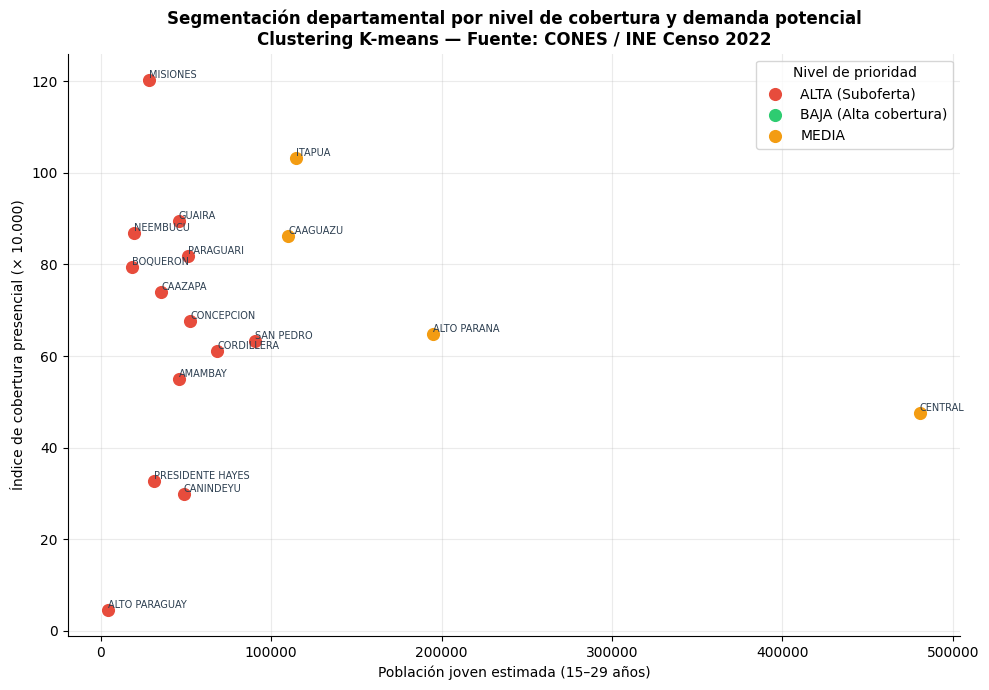

   Guardado: fig3_clusters_territoriales.png


/tmp/ipykernel_6414/3894974972.py:632: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(d["DPTO_NORM"], rotation=45, ha="right", fontsize=9)


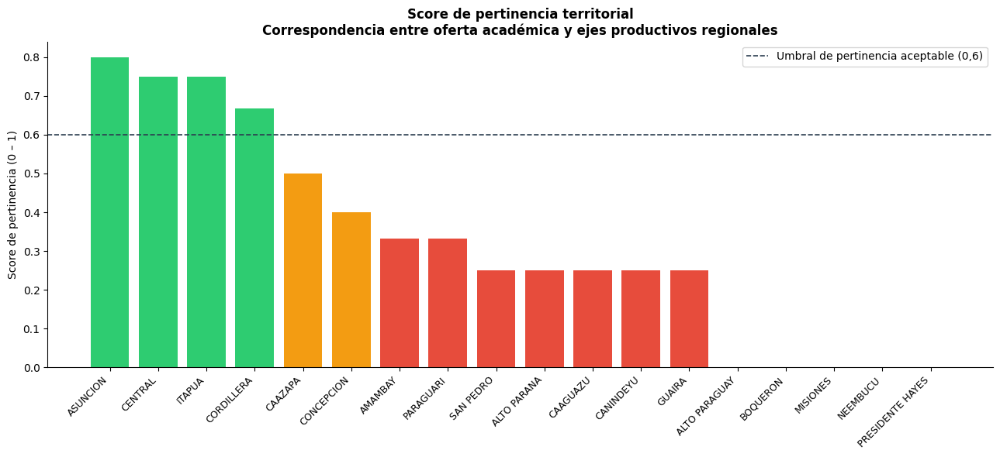

   Guardado: fig4_pertinencia_territorial.png


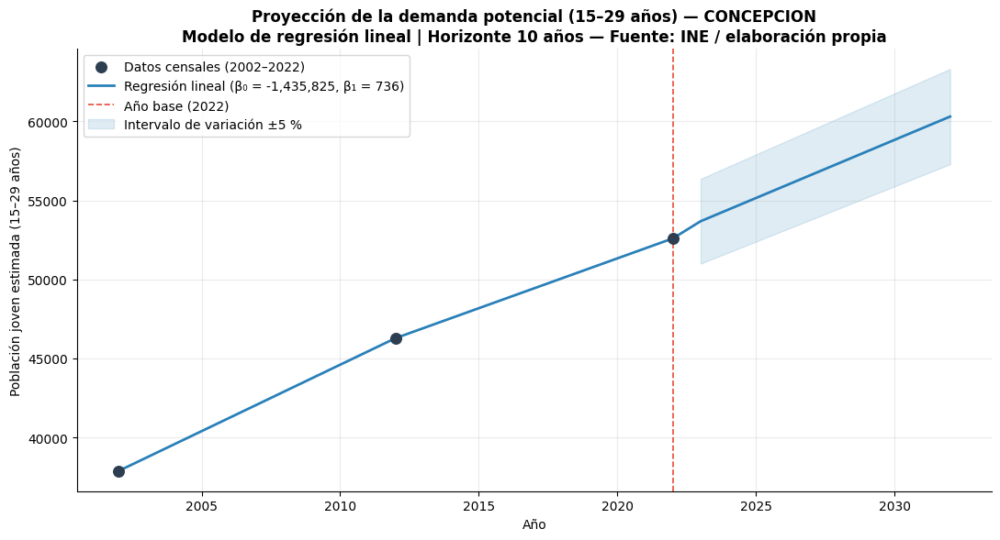

   Guardado: fig5_proyeccion_regresion.png
   Guardado: mapa_cobertura_presencial.html
   Guardado: mapa_cobertura_mediada.html
   Guardado: mapa_pertinencia.html

📋 Tabla resumen — 18 departamentos:


,RANK_IPTE,RANK_SUBOFERTA,DPTO_NORM,IPTE,COBERTURA_N,PERTINENCIA_N,CRECIMIENTO_N,CARRERAS_TOTAL,IDX_PRES_x10K,SCORE_PERTINENCIA,PRIORIDAD
0,1,3,PRESIDENTE HAYES,0.671,0.948,1.000,0.065,113,32.746,0.000,ALTA (Suboferta)
1,2,1,ALTO PARAGUAY,0.670,1.000,1.000,0.009,2,4.560,0.000,ALTA (Suboferta)
2,3,4,CENTRAL,0.661,0.920,0.063,1.000,2461,47.613,0.750,MEDIA
3,4,8,ALTO PARANA,0.660,0.889,0.688,0.405,1352,64.886,0.250,MEDIA
4,5,11,BOQUERON,0.633,0.862,1.000,0.038,153,79.425,0.000,ALTA (Suboferta)
5,6,14,NEEMBUCU,0.630,0.848,1.000,0.041,191,86.871,0.000,ALTA (Suboferta)
6,7,17,MISIONES,0.615,0.786,1.000,0.059,382,120.284,0.000,ALTA (Suboferta)
7,8,7,SAN PEDRO,0.589,0.891,0.688,0.189,622,63.358,0.250,ALTA (Suboferta)
8,9,13,CAAGUAZU,0.589,0.849,0.688,0.229,1009,86.218,0.250,MEDIA
9,10,2,CANINDEYU,0.581,0.953,0.688,0.101,161,29.950,0.250,ALTA (Suboferta)



🗺️  Mapa interactivo — evolución de la demanda potencial:


In [ ]:
# =============================================================================
# MODELADO TERRITORIAL DE LA OFERTA DE EDUCACIÓN SUPERIOR EN PARAGUAY_VF
# Maestría en Ciencia de Datos — Universidad Comunera
# Pipeline integrado: carga, procesamiento, análisis, visualización
# =============================================================================

import json
import pandas as pd
import numpy as np
import unicodedata
import ipywidgets as widgets
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, HTML
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.linear_model import LinearRegression

try:
    import folium
    import branca.colormap as cm
except ImportError:
    folium = None
    print("⚠️ folium no instalado. Los mapas no se generarán.")

# =============================================================================
# BLOQUE 1 | CONFIGURACIÓN
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OG  — Analizar la distribución territorial de la oferta de educación
#          superior mediante herramientas de ciencia de datos
#   OE1 — Analizar la distribución territorial considerando cantidad de
#          carreras, diversidad disciplinar y modalidad de enseñanza
#   OE2 — Estimar la demanda potencial a partir de la población joven
#          en edad universitaria como variable proxy
# =============================================================================

RUTA_CONES = "/content/registro_nacional_carreras.txt"
RUTA_GEO   = "/content/departamentos_geojson.txt"
RUTA_INE1  = "/content/Cuadro 1. Paraguay. Población total por área urbana-rural y sexo, según departamento y distrito, 2022. (1).xlsx"
RUTA_INE2  = "/content/Cuadro 2. Paraguay. Población total por área urbana-rural y sexo, según grupos de edad, 2022..xlsx"

ANIO_BASE       = 2022
N_CLUSTERS      = 3
RANDOM_STATE    = 42
HORIZONTE_PROY  = 10
FILTRAR_ACTIVAS = True

# Ejes productivos por departamento
# Fuentes oficiales:
#   — MAG (Ministerio de Agricultura y Ganadería): Anuario Estadístico
#     Agropecuario 2022. Sustenta los ejes: AGRONOMIA, GANADERIA,
#     VETERINARIA, AGROINDUSTRIA, FORESTAL, AMBIENTE.
#     Disponible en: www.mag.gov.py
#   — MIC (Ministerio de Industria y Comercio): Plan Nacional de
#     Desarrollo Industrial 2030. Sustenta los ejes: INDUSTRIA,
#     COMERCIO, LOGISTICA, TECNOLOGIA.
#     Disponible en: www.mic.gov.py
#   — MTESS (Ministerio de Trabajo, Empleo y Seguridad Social):
#     Boletín de Estadísticas Laborales 2022. Sustenta la identificación
#     de sectores con mayor demanda de recursos humanos calificados
#     por departamento. Disponible en: www.mtess.gov.py
#   — STP (Secretaría Técnica de Planificación): Plan Nacional de
#     Desarrollo Paraguay 2030. Define los ejes estratégicos territoriales
#     por región. Disponible en: www.stp.gov.py
#   — BCP (Banco Central del Paraguay): Cuentas Nacionales por sector.
#     Sustenta la ponderación productiva de cada eje por departamento.
#     Disponible en: www.bcp.gov.py
# Nota: los ejes asignados a cada departamento deben revisarse y
# actualizarse ante cambios en las fuentes oficiales citadas.
# Vinculación: OE5 — Análisis de pertinencia territorial
EJES_PRODUCTIVOS = {
    "CONCEPCION":       ["INGENIERIA","LOGISTICA","AMBIENTE","FORESTAL","AGRONOMIA"],
    "SAN PEDRO":        ["AGRONOMIA","VETERINARIA","AGROINDUSTRIA","AMBIENTE"],
    "CORDILLERA":       ["TURISMO","ADMINISTRACION","TECNOLOGIA"],
    "GUAIRA":           ["AGRONOMIA","TURISMO","INDUSTRIA","AMBIENTE"],
    "CAAGUAZU":         ["AGRONOMIA","VETERINARIA","AGROINDUSTRIA","LOGISTICA"],
    "CAAZAPA":          ["AGRONOMIA","FORESTAL","AMBIENTE","EDUCACION"],
    "ITAPUA":           ["AGRONOMIA","SALUD","TECNOLOGIA","COMERCIO"],
    "MISIONES":         ["GANADERIA","VETERINARIA","AGROINDUSTRIA"],
    "PARAGUARI":        ["TURISMO","ADMINISTRACION","AGROINDUSTRIA"],
    "ALTO PARANA":      ["INDUSTRIA","TECNOLOGIA","LOGISTICA","COMERCIO"],
    "CENTRAL":          ["TECNOLOGIA","SALUD","ADMINISTRACION","INDUSTRIA"],
    "NEEMBUCU":         ["AMBIENTE","TURISMO","AGROINDUSTRIA"],
    "AMAMBAY":          ["LOGISTICA","COMERCIO","AGRONOMIA"],
    "CANINDEYU":        ["AGRONOMIA","VETERINARIA","AMBIENTE","LOGISTICA"],
    "PRESIDENTE HAYES": ["GANADERIA","VETERINARIA","LOGISTICA","AMBIENTE"],
    "BOQUERON":         ["GANADERIA","AGROINDUSTRIA","LOGISTICA","AMBIENTE"],
    "ALTO PARAGUAY":    ["GANADERIA","AMBIENTE","LOGISTICA"],
    "ASUNCION":         ["SALUD","TECNOLOGIA","ADMINISTRACION","DERECHO","EDUCACION"],
}


# =============================================================================
# BLOQUE 2 | FUNCIONES DE SOPORTE
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OG  — Garantiza la consistencia de los datos de entrada para el análisis
#          territorial mediante normalización y estandarización
#   OE1 — Clasificación de modalidades de enseñanza (presencial / mediada
#          por tecnología / virtual) según criterios MEC/CONES
#   OE5 — Clasificación de áreas académicas en ejes productivos estratégicos
#          para el análisis de pertinencia territorial
# =============================================================================

def norm_depto(nombre):
    """
    Normaliza nombres de departamentos eliminando tildes y estandarizando
    denominaciones alternativas para garantizar consistencia en los joins.
    """
    if not isinstance(nombre, str):
        return ""
    s = "".join(
        c for c in unicodedata.normalize("NFD", nombre.upper().strip())
        if unicodedata.category(c) != "Mn"
    )
    mapeo = {
        "CAPITAL":    "ASUNCION",
        "ÑEEMBUCU":   "NEEMBUCU",
        "EEMBUCU":    "NEEMBUCU",
        "PTE HAYES":  "PRESIDENTE HAYES",
        "PDTE HAYES": "PRESIDENTE HAYES",
    }
    for k, v in mapeo.items():
        if k in s:
            return v
    return s

def safe_col(df, candidates):
    """Devuelve la primera columna disponible de una lista de candidatos."""
    for c in candidates:
        if c in df.columns:
            return c
    return None

def normalizar_modalidad(x):
    """
    Clasifica la modalidad de enseñanza según los criterios del MEC/CONES:
    presencial, mediada por tecnología, virtual u otra.
    — OE1: Analizar distribución por modalidad de enseñanza
    — OE4: Examinar si la modalidad mediada por tecnología contribuye
           a reducir diferencias territoriales en la oferta educativa
    """
    x = "" if pd.isna(x) else str(x).upper().strip()
    if any(k in x for k in ["SEMI","HIBR","MEDIAD"]):
        return "MEDIADA_TECNOLOGIA"
    if "VIRT" in x:
        return "VIRTUAL"
    if "PRES" in x:
        return "PRESENCIAL"
    return "OTRA"

def clasificar_area_estrategica(area):
    """
    Mapea las denominaciones de áreas académicas del CONES a categorías
    de ejes productivos para el análisis de pertinencia territorial.
    — OE5: Analizar correspondencia entre oferta académica y estructura
           productiva regional
    """
    s = str(area).upper()
    if "AGROIND"  in s:                                     return "AGROINDUSTRIA"
    if any(k in s for k in ["AGRON","AGRIC","AGRO"]):       return "AGRONOMIA"
    if "VETER"    in s:                                     return "VETERINARIA"
    if any(k in s for k in ["INGEN","MECAN","ELEC"]):       return "INGENIERIA"
    if "INDUST"   in s:                                     return "INDUSTRIA"
    if any(k in s for k in ["INFORM","SISTEM","SOFT","COMPUT","DATA","TECNO"]): return "TECNOLOGIA"
    if any(k in s for k in ["MEDIC","ENFER","SALUD","ODONT","BIO"]):            return "SALUD"
    if any(k in s for k in ["ADMIN","CONTA","FINAN","ECON","NEGOC"]):           return "ADMINISTRACION"
    if "COMERC"   in s:                                     return "COMERCIO"
    if any(k in s for k in ["LOGIST","TRANSP"]):            return "LOGISTICA"
    if any(k in s for k in ["AMBI","RECURSOS NAT"]):        return "AMBIENTE"
    if "FOREST"   in s:                                     return "FORESTAL"
    if any(k in s for k in ["TURIS","HOTEL"]):              return "TURISMO"
    if any(k in s for k in ["DERECH","JURID"]):             return "DERECHO"
    if any(k in s for k in ["EDUC","DOCEN","PEDAG"]):       return "EDUCACION"
    if "GANAD"    in s:                                     return "GANADERIA"
    return "OTRA"

def asignar_prioridad(series_promedios):
    """
    Etiqueta los clusters ordenados de menor a mayor cobertura:
    Alta suboferta → Media → Baja suboferta (alta cobertura).
    — OE3: Comparar oferta y demanda potencial para identificar
           desajustes territoriales
    """
    orden  = series_promedios.sort_values().index.tolist()
    labels = ["ALTA (Suboferta)", "MEDIA", "BAJA (Alta cobertura)"]
    return {cl: (labels[i] if i < len(labels) else f"GRUPO_{i+1}") for i, cl in enumerate(orden)}


# =============================================================================
# BLOQUE 3 | LECTURA DE ARCHIVOS
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OG  — Integración de fuentes oficiales para el análisis territorial
#   OE1 — Carga del Registro Nacional de Carreras (CONES) como fuente
#          primaria de la oferta educativa
#   OE2 — Carga de datos censales INE 2022 para estimación de la
#          demanda potencial por departamento
# =============================================================================

def leer_cones(path):
    # OE1 — Fuente primaria de la oferta de educación superior
    with open(path, "r", encoding="utf-8") as f:
        txt = f.read().strip().replace("\ufeff", "")
    return pd.DataFrame(json.loads(txt))

def leer_geojson(path):
    # OG — Base cartográfica para la visualización geoespacial territorial
    with open(path, "r", encoding="utf-8") as f:
        geo = json.load(f)
    for feat in geo.get("features", []):
        props = feat.get("properties", {})
        props["DPTO_NORM"] = norm_depto(props.get("DPTO_DESC", ""))
        feat["properties"] = props
    return geo

def leer_cuadro1(path):
    """
    Cuadro 1 INE — Población total por departamento y distrito.
    Extrae únicamente las filas correspondientes al nivel departamental.
    — OE2: Fuente demográfica para la estimación de la demanda potencial
    """
    raw = pd.read_excel(path, header=None)
    pos = None
    for r in range(raw.shape[0]):
        for c in range(raw.shape[1]):
            val = raw.iat[r, c]
            if isinstance(val, str) and "departamento" in val.lower() and "distrito" in val.lower():
                pos = (r, c); break
        if pos: break
    if not pos:
        raise ValueError("No se encontró 'Departamento y distrito' en Cuadro 1.")
    hr, cn = pos
    df = raw.iloc[hr+1:, [cn, cn+1]].copy()
    df.columns = ["NOMBRE", "TOTAL"]
    df = df.dropna(subset=["NOMBRE"])
    df["NOMBRE"] = df["NOMBRE"].astype(str).str.strip()
    df["TOTAL"]  = pd.to_numeric(df["TOTAL"], errors="coerce")
    dep = df[df["NOMBRE"].str.contains("Departamento", case=False, na=False)].copy()
    dep["DPTO_NORM"] = dep["NOMBRE"].str.replace("Departamento","",case=False).str.strip().apply(norm_depto)
    return dep[["DPTO_NORM","TOTAL"]].rename(columns={"TOTAL":"POB_TOTAL"}).dropna(subset=["POB_TOTAL"])

def leer_cuadro2(path):
    """
    Cuadro 2 INE — Estructura etaria nacional.
    Calcula la proporción de jóvenes de 15 a 29 años sobre el total del país.
    — OE2: Proporción utilizada como factor de estimación de la demanda
           potencial de educación superior por departamento
    """
    raw = pd.read_excel(path, header=None)
    pos = None
    for r in range(raw.shape[0]):
        for c in range(raw.shape[1]):
            val = raw.iat[r, c]
            if isinstance(val, str) and "grupos de edad" in val.lower():
                pos = (r, c); break
        if pos: break
    if not pos:
        raise ValueError("No se encontró 'Grupos de edad' en Cuadro 2.")
    hr, cg = pos
    df = raw.iloc[hr+1:, [cg, cg+1]].copy()
    df.columns = ["GRUPO","TOTAL"]
    df = df.dropna(subset=["GRUPO"])
    df["GRUPO"] = df["GRUPO"].astype(str).str.strip()
    df["TOTAL"] = pd.to_numeric(df["TOTAL"], errors="coerce")
    ft = df[df["GRUPO"].str.fullmatch("Total", case=False, na=False)]
    total_pais = float(ft["TOTAL"].iloc[0]) if not ft.empty else float(df["TOTAL"].max())
    mask = df["GRUPO"].str.contains(r"15\s*-\s*19|20\s*-\s*24|25\s*-\s*29", na=False)
    total_1529 = float(df.loc[mask,"TOTAL"].sum())
    if total_pais <= 0 or total_1529 <= 0:
        raise ValueError("Error al calcular la proporción 15–29 en Cuadro 2.")
    return total_1529 / total_pais


# =============================================================================
# BLOQUE 4 | OFERTA EDUCATIVA
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE1 — Analizar la distribución territorial de la oferta considerando
#          cantidad de carreras, diversidad disciplinar y modalidad de enseñanza
#   OE4 — Examinar la distribución territorial por modalidad (presencial
#          y mediada por tecnología)
# =============================================================================

def preparar_cones(df_raw):
    """
    Prepara el registro CONES asignando departamento normalizado,
    modalidad de enseñanza y área académica a cada carrera.
    — OE1: Base para el análisis de distribución territorial de la oferta
    — OE4: Desagregación por modalidad presencial y mediada por tecnología
    """
    col_depto   = safe_col(df_raw, ["departamento","Departamento"])
    col_modal   = safe_col(df_raw, ["modalidad_estudio","modalidad","Modalidad"])
    col_area    = safe_col(df_raw, ["clasificacion_campo_amplio","clasificacion_campo","area","Area"])
    col_area_id = safe_col(df_raw, ["titulo_area_id","area_id"])
    col_activa  = safe_col(df_raw, ["activa","Activa"])
    if col_depto is None:
        raise ValueError("No se encontró la columna 'departamento' en el registro CONES.")
    df = df_raw.copy()
    df["DPTO_NORM"] = df[col_depto].apply(norm_depto)
    df["MODALIDAD"] = df[col_modal].apply(normalizar_modalidad) if col_modal else "OTRA"
    df["AREA"] = df[col_area].astype(str).str.strip() if col_area else np.nan
    if col_area:
        df.loc[df["AREA"].isin(["","None","nan","NaN"]), "AREA"] = np.nan
    if col_area_id:
        df["AREA"] = df["AREA"].fillna(df[col_area_id].astype(str))
    df["AREA"] = df["AREA"].fillna("SIN_CLASIFICAR")
    if FILTRAR_ACTIVAS and col_activa:
        tmp = df[col_activa].astype(str).str.upper().str.strip()
        df  = df[tmp.isin(["SI","SÍ","TRUE","1"])].copy()
    return df

def construir_oferta(df):
    """
    Construye la tabla de oferta educativa por departamento desagregada
    por modalidad de enseñanza y por área académica (clasificación Frascati).
    — OE1: Distribución territorial por cantidad de carreras y diversidad disciplinar
    — OE4: Desagregación presencial / mediada por tecnología / virtual
    """
    of = df.groupby("DPTO_NORM").size().reset_index(name="CARRERAS_TOTAL")
    for modal, col in [
        ("PRESENCIAL",         "CARRERAS_PRES"),
        ("MEDIADA_TECNOLOGIA", "CARRERAS_MED"),
        ("VIRTUAL",            "CARRERAS_VIRT"),
    ]:
        tmp = df[df["MODALIDAD"]==modal].groupby("DPTO_NORM").size().reset_index(name=col)
        of  = of.merge(tmp, on="DPTO_NORM", how="left")
    of = of.fillna(0)
    for c in ["CARRERAS_TOTAL","CARRERAS_PRES","CARRERAS_MED","CARRERAS_VIRT"]:
        of[c] = pd.to_numeric(of[c], errors="coerce").fillna(0)

    # Oferta por área académica — OE1 (diversidad disciplinar) y OE5 (pertinencia)
    of_area  = df.groupby(["DPTO_NORM","AREA"]).size().reset_index(name="CARRERAS_AREA_TOTAL")
    of_areap = df[df["MODALIDAD"]=="PRESENCIAL"].groupby(["DPTO_NORM","AREA"]).size().reset_index(name="CARRERAS_AREA_PRES")
    df_area  = of_area.merge(of_areap, on=["DPTO_NORM","AREA"], how="left").fillna(0)

    return of, df_area


# =============================================================================
# BLOQUE 5 | DEMANDA POTENCIAL Y PROYECCIÓN
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE2 — Estimar la demanda potencial a partir de la población joven
#          en edad universitaria como variable proxy demográfica
#   OE6 — Proyectar escenarios de demanda potencial a cinco y diez años
#          para evaluar la sostenibilidad territorial de la oferta
# Modelo: Regresión lineal simple — Ec. 2: y = β₀ + β₁x + ε
# =============================================================================

def construir_demanda(df_pob, prop_1529):
    """
    Estima la demanda potencial de educación superior para cada departamento
    aplicando la proporción nacional de jóvenes de 15 a 29 años a la
    población total departamental como variable proxy demográfica.
    — OE2: Estimación de la demanda potencial por departamento
    """
    df = df_pob.copy()
    df["POB_15_29_EST"] = df["POB_TOTAL"] * prop_1529
    return df

def proyectar_regresion(df_demanda):
    """
    Proyecta la demanda potencial mediante regresión lineal (Ec. 2)
    sobre los puntos censales disponibles: 2002, 2012 y 2022.
    Cada departamento obtiene parámetros β₀ y β₁ propios, capturando
    tendencias de crecimiento demográfico territorial diferenciadas.
    — OE6: Proyección de escenarios de demanda a 5 y 10 años
    """
    anios_hist = np.array([2002, 2012, 2022])
    anios_proy = np.array(range(ANIO_BASE + 1, ANIO_BASE + HORIZONTE_PROY + 1))
    filas = []
    for _, row in df_demanda.iterrows():
        pob_base = row["POB_15_29_EST"]
        # Aproximación histórica con tasas censales Paraguay
        pob_hist = np.array([pob_base * 0.72, pob_base * 0.88, pob_base])
        model = LinearRegression()
        model.fit(anios_hist.reshape(-1,1), pob_hist)
        proy = np.maximum(model.predict(anios_proy.reshape(-1,1)), 0)
        fila = {
            "DPTO_NORM":     row["DPTO_NORM"],
            "POB_15_29_EST": pob_base,
            "BETA0":         round(model.intercept_, 2),
            "BETA1":         round(model.coef_[0], 2),
        }
        for a, v in zip(anios_proy, proy):
            fila[f"POB_PROY_{a}"] = round(v, 0)
        filas.append(fila)
    return pd.DataFrame(filas)


# =============================================================================
# BLOQUE 6 | ÍNDICE DE COBERTURA TERRITORIAL
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE3 — Comparar la oferta y la demanda potencial mediante un indicador
#          de cobertura relativa para identificar desajustes territoriales
# Indicador: ICᵢ = Cᵢ / Pᵢ × 10.000 — Ec. 1 del Marco Metodológico
# =============================================================================

def construir_indices(df):
    """
    Calcula los índices de cobertura relativa por modalidad de enseñanza,
    normalizados por cada 10.000 jóvenes en edad universitaria (Ec. 1).
    Permite comparaciones interdepartamentales con independencia del tamaño
    poblacional absoluto, evitando sesgos asociados a la escala territorial.
    — OE3: Indicador central para identificar desajustes oferta-demanda
    — OE4: Índices diferenciados por modalidad (presencial y mediada)
    """
    pob = df["POB_15_29_EST"].replace(0, np.nan).fillna(df["POB_15_29_EST"].median())
    df = df.copy()
    df["IDX_TOTAL_x10K"] = (df["CARRERAS_TOTAL"] / pob) * 10000
    df["IDX_PRES_x10K"]  = (df["CARRERAS_PRES"]  / pob) * 10000
    df["IDX_MED_x10K"]   = (df["CARRERAS_MED"]   / pob) * 10000
    df["IDX_VIRT_x10K"]  = (df["CARRERAS_VIRT"]  / pob) * 10000
    # Brecha respecto a la mediana nacional — OE3
    df["BRECHA_PRES"]    = df["IDX_PRES_x10K"] - df["IDX_PRES_x10K"].median()
    return df


# =============================================================================
# BLOQUE 7 | DIVERSIDAD Y PERTINENCIA TERRITORIAL
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE1 — Diversidad disciplinar de la oferta según clasificación Frascati
#   OE5 — Correspondencia entre la oferta académica y la estructura
#          productiva regional (pertinencia territorial)
#   OE7 — Insumo para proponer lineamientos de planificación educativa
# =============================================================================

def construir_diversidad(df_cones):
    """
    Mide la amplitud disciplinar de la oferta en cada departamento como
    cociente entre el número de áreas únicas y el total de carreras.
    — OE1: Dimensión de diversidad disciplinar de la oferta educativa
    """
    div = (df_cones.groupby("DPTO_NORM")
           .agg(AREAS_UNICAS=("AREA","nunique"), TOTAL_CARRERAS=("AREA","size"))
           .reset_index())
    div["INDICE_DIVERSIDAD"] = (div["AREAS_UNICAS"] / div["TOTAL_CARRERAS"].replace(0,np.nan)).fillna(0).round(3)
    return div[["DPTO_NORM","AREAS_UNICAS","INDICE_DIVERSIDAD"]]

def construir_pertinencia(df_cones):
    """
    Contrasta la oferta académica con los ejes productivos de cada departamento.
    El score de pertinencia (0–1) mide la proporción de áreas estratégicas
    cubiertas sobre las requeridas según la estructura productiva regional.
    — OE5: Correspondencia entre oferta académica y ejes productivos regionales
    — OE7: Identificación de áreas faltantes como insumo para lineamientos
    """
    tmp = df_cones.copy()
    tmp["AREA_ESTRAT"] = tmp["AREA"].apply(clasificar_area_estrategica)
    ofertadas = (tmp.groupby("DPTO_NORM")["AREA_ESTRAT"]
                 .apply(lambda x: set(x) - {"OTRA"})
                 .reset_index(name="AREAS_OFERTADAS"))
    filas = []
    for _, row in ofertadas.iterrows():
        dpto      = row["DPTO_NORM"]
        ofert     = row["AREAS_OFERTADAS"]
        requer    = set(EJES_PRODUCTIVOS.get(dpto, []))
        cubiertas = ofert & requer
        faltantes = requer - ofert
        score     = round(len(cubiertas) / len(requer), 3) if requer else np.nan
        filas.append({
            "DPTO_NORM":            dpto,
            "AREAS_EJE_REQUERIDAS": ", ".join(sorted(requer)),
            "AREAS_EJE_CUBIERTAS":  ", ".join(sorted(cubiertas)),
            "AREAS_EJE_FALTANTES":  ", ".join(sorted(faltantes)),
            "SCORE_PERTINENCIA":    score,
        })
    return pd.DataFrame(filas)


# =============================================================================
# BLOQUE 8 | CLUSTERING TERRITORIAL — K-MEANS
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE3 — Clasificación de departamentos en niveles de cobertura relativa
#          para identificar desajustes territoriales oferta-demanda
#   OG  — Aplicación de técnicas de ciencia de datos (K-means) para
#          identificar patrones de distribución territorial
# Validación: Método del Codo (Thorndike, 1953) + Silueta (Rousseeuw, 1987)
# =============================================================================

def validar_k_optimo(X_scaled, k_max=8):
    """
    Determina el número óptimo de clusters mediante dos criterios complementarios:
    Método del Codo (reducción de inercia intra-cluster) y Coeficiente de Silueta
    (cohesión y separación entre grupos).
    El gráfico resultante se exporta como evidencia metodológica para la tesis.
    — OG:  Validación metodológica del análisis de clustering territorial
    — OE3: Fundamento para la clasificación de departamentos por nivel de cobertura
    """
    ks       = list(range(2, min(k_max+1, len(X_scaled))))
    inercias = []
    siluetas = []
    for k in ks:
        km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=20)
        lb = km.fit_predict(X_scaled)
        inercias.append(km.inertia_)
        siluetas.append(silhouette_score(X_scaled, lb) if len(set(lb)) > 1 else 0)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))
    fig.suptitle("Validación del número óptimo de clusters (K)", fontsize=13, fontweight="bold")

    ax1.plot(ks, inercias, marker="o", color="#2C3E50", linewidth=2)
    ax1.axvline(x=N_CLUSTERS, color="#E74C3C", linestyle="--", linewidth=1.5,
                label=f"K = {N_CLUSTERS} seleccionado")
    ax1.set_title("Método del Codo\nThorndike, 1953", fontsize=11)
    ax1.set_xlabel("Número de clusters (K)")
    ax1.set_ylabel("Inercia intra-cluster")
    ax1.legend(); ax1.grid(alpha=0.3)
    ax1.spines["top"].set_visible(False); ax1.spines["right"].set_visible(False)

    ax2.plot(ks, siluetas, marker="s", color="#27AE60", linewidth=2)
    ax2.axvline(x=N_CLUSTERS, color="#E74C3C", linestyle="--", linewidth=1.5,
                label=f"K = {N_CLUSTERS} seleccionado")
    ax2.set_title("Coeficiente de Silueta\nRousseeuw, 1987", fontsize=11)
    ax2.set_xlabel("Número de clusters (K)")
    ax2.set_ylabel("Score de silueta promedio")
    ax2.legend(); ax2.grid(alpha=0.3)
    ax2.spines["top"].set_visible(False); ax2.spines["right"].set_visible(False)

    plt.tight_layout()
    plt.savefig("validacion_k_clusters.png", dpi=300, bbox_inches="tight")
    plt.show(); plt.close()

    k_opt = ks[siluetas.index(max(siluetas))]
    sil_k = siluetas[N_CLUSTERS - 2]
    print(f"   K óptimo por silueta: {k_opt} | K seleccionado: {N_CLUSTERS} | Silueta en K={N_CLUSTERS}: {sil_k:.3f}")

def clustering_general(df):
    """
    Agrupa los 18 departamentos según niveles de cobertura educativa utilizando
    variables estandarizadas: cantidad de carreras, índices por modalidad
    y brecha respecto a la mediana nacional.
    — OE3: Clasificación territorial en niveles de cobertura relativa
    — OG:  Aplicación de K-means como técnica de ciencia de datos
    """
    feats = ["CARRERAS_TOTAL","IDX_TOTAL_x10K","IDX_PRES_x10K","IDX_MED_x10K","IDX_VIRT_x10K","BRECHA_PRES"]
    X  = df[feats].replace([np.inf,-np.inf], np.nan).fillna(0)
    Xn = StandardScaler().fit_transform(X)

    validar_k_optimo(Xn)

    n_real = min(N_CLUSTERS, len(pd.DataFrame(Xn).drop_duplicates()))
    km = KMeans(n_clusters=n_real, random_state=RANDOM_STATE, n_init=20)
    df = df.copy()
    df["CLUSTER"]   = km.fit_predict(Xn)
    proms           = df.groupby("CLUSTER")["IDX_PRES_x10K"].mean()
    df["PRIORIDAD"] = df["CLUSTER"].map(asignar_prioridad(proms)).fillna("SIN_PRIORIDAD")
    return df


# =============================================================================
# BLOQUE 9 | VISUALIZACIONES
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE1 — fig1: Distribución territorial por modalidad de enseñanza
#   OE3 — fig2: Índice de cobertura presencial vs mediana nacional
#   OE3 — fig3: Segmentación por clustering (oferta vs demanda potencial)
#   OE5 — fig4: Score de pertinencia territorial por departamento
#   OE6 — fig5: Proyección de demanda por regresión lineal
# =============================================================================

def grafico_oferta_modalidades(df, out="fig1_oferta_modalidades.png"):
    # OE1 — Distribución territorial de la oferta por modalidad de enseñanza
    d = df.sort_values("CARRERAS_TOTAL", ascending=False)
    x = np.arange(len(d))
    fig, ax = plt.subplots(figsize=(14,6))
    ax.bar(x, d["CARRERAS_PRES"], label="Presencial",              color="#2980B9")
    ax.bar(x, d["CARRERAS_MED"],  bottom=d["CARRERAS_PRES"],       label="Mediada por tecnología", color="#F39C12")
    ax.bar(x, d["CARRERAS_VIRT"], bottom=d["CARRERAS_PRES"]+d["CARRERAS_MED"], label="Virtual",   color="#27AE60")
    ax.set_xticks(x); ax.set_xticklabels(d["DPTO_NORM"], rotation=45, ha="right", fontsize=9)
    ax.set_title("Distribución territorial de la oferta educativa por modalidad de enseñanza\nFuente: CONES — elaboración propia", fontweight="bold")
    ax.set_ylabel("Cantidad de carreras"); ax.legend()
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.savefig(out, dpi=300); plt.show(); plt.close()
    print(f"   Guardado: {out}")

def grafico_cobertura_presencial(df, out="fig2_cobertura_presencial.png"):
    # OE3 — Índice de cobertura relativa para identificar desajustes territoriales
    d   = df.sort_values("IDX_PRES_x10K", ascending=False)
    med = d["IDX_PRES_x10K"].median()
    cols = ["#E74C3C" if v < med else "#2ECC71" for v in d["IDX_PRES_x10K"]]
    fig, ax = plt.subplots(figsize=(14,6))
    ax.bar(d["DPTO_NORM"], d["IDX_PRES_x10K"], color=cols)
    ax.axhline(med, color="#2C3E50", linestyle="--", linewidth=1.5)
    ax.set_xticklabels(d["DPTO_NORM"], rotation=45, ha="right", fontsize=9)
    ax.set_title("Índice de cobertura presencial por departamento\nCarreras por cada 10.000 jóvenes de 15 a 29 años — Fuente: CONES / INE Censo 2022", fontweight="bold")
    ax.set_ylabel("Índice de cobertura (× 10.000)")
    p1 = mpatches.Patch(color="#2ECC71", label="Por encima de la mediana")
    p2 = mpatches.Patch(color="#E74C3C", label="Por debajo de la mediana")
    p3 = mpatches.Patch(color="#2C3E50", label=f"Mediana nacional ({med:.1f})")
    ax.legend(handles=[p1, p2, p3])
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.savefig(out, dpi=300); plt.show(); plt.close()
    print(f"   Guardado: {out}")

def grafico_scatter_clusters(df, out="fig3_clusters_territoriales.png"):
    # OE3 — Segmentación departamental por nivel de cobertura y demanda potencial
    colores = {
        "ALTA (Suboferta)":     "#E74C3C",
        "MEDIA":                "#F39C12",
        "BAJA (Alta cobertura)":"#2ECC71",
    }
    fig, ax = plt.subplots(figsize=(10,7))
    for prioridad, grupo in df.groupby("PRIORIDAD"):
        ax.scatter(grupo["POB_15_29_EST"], grupo["IDX_PRES_x10K"],
                   label=prioridad, color=colores.get(prioridad,"#95A5A6"),
                   s=110, zorder=3, edgecolors="white")
        for _, row in grupo.iterrows():
            ax.annotate(row["DPTO_NORM"], (row["POB_15_29_EST"], row["IDX_PRES_x10K"]),
                        fontsize=7, ha="left", va="bottom", color="#2C3E50")
    ax.set_xlabel("Población joven estimada (15–29 años)", fontsize=10)
    ax.set_ylabel("Índice de cobertura presencial (× 10.000)", fontsize=10)
    ax.set_title("Segmentación departamental por nivel de cobertura y demanda potencial\nClustering K-means — Fuente: CONES / INE Censo 2022", fontweight="bold")
    ax.legend(title="Nivel de prioridad"); ax.grid(alpha=0.25)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.savefig(out, dpi=300); plt.show(); plt.close()
    print(f"   Guardado: {out}")

def grafico_pertinencia(df_pert, out="fig4_pertinencia_territorial.png"):
    # OE5 — Correspondencia entre oferta académica y ejes productivos regionales
    d = df_pert.dropna(subset=["SCORE_PERTINENCIA"]).sort_values("SCORE_PERTINENCIA", ascending=False)
    cols = ["#2ECC71" if v >= 0.6 else ("#F39C12" if v >= 0.4 else "#E74C3C") for v in d["SCORE_PERTINENCIA"]]
    fig, ax = plt.subplots(figsize=(13,6))
    ax.bar(d["DPTO_NORM"], d["SCORE_PERTINENCIA"], color=cols)
    ax.axhline(0.6, color="#2C3E50", linestyle="--", linewidth=1.2, label="Umbral de pertinencia aceptable (0,6)")
    ax.set_xticklabels(d["DPTO_NORM"], rotation=45, ha="right", fontsize=9)
    ax.set_title("Score de pertinencia territorial\nCorrespondencia entre oferta académica y ejes productivos regionales", fontweight="bold")
    ax.set_ylabel("Score de pertinencia (0 – 1)"); ax.legend()
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.savefig(out, dpi=300); plt.show(); plt.close()
    print(f"   Guardado: {out}")

def grafico_proyeccion_regresion(df_proy, dpto="CONCEPCION", out="fig5_proyeccion_regresion.png"):
    """
    Proyección de demanda potencial mediante regresión lineal con puntos
    censales históricos, línea de tendencia e intervalo de variación ±5%.
    — OE6: Proyección de escenarios de demanda a 5 y 10 años
    """
    row = df_proy[df_proy["DPTO_NORM"] == dpto]
    if row.empty:
        print(f"   No se encontró {dpto}. Se omite la proyección."); return
    r = row.iloc[0]
    anios_hist = np.array([2002, 2012, 2022])
    pob_base   = r["POB_15_29_EST"]
    pob_hist   = np.array([pob_base * 0.72, pob_base * 0.88, pob_base])
    anios_proy = np.array(range(ANIO_BASE + 1, ANIO_BASE + HORIZONTE_PROY + 1))
    pob_proy   = np.array([r[f"POB_PROY_{a}"] for a in anios_proy])

    fig, ax = plt.subplots(figsize=(11,6))
    ax.scatter(anios_hist, pob_hist, color="#2C3E50", s=70, zorder=5, label="Datos censales (2002–2022)")
    ax.plot(np.append(anios_hist, anios_proy), np.append(pob_hist, pob_proy),
            color="#2980B9", linewidth=2,
            label=f"Regresión lineal (β₀ = {r['BETA0']:,.0f}, β₁ = {r['BETA1']:,.0f})")
    ax.axvline(x=ANIO_BASE, color="#E74C3C", linestyle="--", linewidth=1.2, label="Año base (2022)")
    ax.fill_between(anios_proy, pob_proy * 0.95, pob_proy * 1.05,
                    alpha=0.15, color="#2980B9", label="Intervalo de variación ±5 %")
    ax.set_title(f"Proyección de la demanda potencial (15–29 años) — {dpto}\nModelo de regresión lineal | Horizonte {HORIZONTE_PROY} años — Fuente: INE / elaboración propia", fontweight="bold")
    ax.set_xlabel("Año"); ax.set_ylabel("Población joven estimada (15–29 años)")
    ax.legend(); ax.grid(alpha=0.25)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.savefig(out, dpi=300); plt.show(); plt.close()
    print(f"   Guardado: {out}")


# =============================================================================
# BLOQUE 10 | MAPA INTERACTIVO CON SLIDER TEMPORAL
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OE6 — Visualización de la evolución de la demanda potencial a lo largo
#          del horizonte de proyección por departamento
#   OG  — Herramienta de visualización geoespacial interactiva para la
#          identificación de patrones territoriales futuros
# =============================================================================

def mapa_slider_demanda(df_proy, geojson_data):
    """
    Mapa interactivo con control deslizante temporal para visualizar
    la evolución de la demanda potencial (15–29 años) por departamento.
    Permite identificar regiones donde la presión demográfica sobre el
    sistema educativo aumentará de forma más pronunciada en el mediano plazo.
    — OE6: Escenarios prospectivos de demanda potencial
    — OG:  Visualización geoespacial interactiva
    """
    if folium is None:
        print("   folium no instalado. No se puede generar el mapa interactivo."); return

    lookup = {}
    for _, row in df_proy.iterrows():
        dpto = row["DPTO_NORM"]
        lookup[dpto] = {ANIO_BASE: row["POB_15_29_EST"]}
        for a in range(ANIO_BASE+1, ANIO_BASE+HORIZONTE_PROY+1):
            col = f"POB_PROY_{a}"
            lookup[dpto][a] = float(row[col]) if col in row.index else lookup[dpto][ANIO_BASE]

    todos_vals = [v for d in lookup.values() for v in d.values()]
    vmin, vmax = min(todos_vals), max(todos_vals)

    colormap = cm.LinearColormap(
        ["#FEF0D9","#FDCC8A","#FC8D59","#E34A33","#B30000"],
        vmin=vmin, vmax=vmax,
        caption="Población joven estimada (15–29 años)"
    )

    slider = widgets.IntSlider(
        value=ANIO_BASE, min=ANIO_BASE, max=ANIO_BASE+HORIZONTE_PROY,
        step=1, description="Año:", continuous_update=False,
        layout=widgets.Layout(width="500px")
    )
    out_mapa = widgets.Output()

    def actualizar(change):
        anio = change["new"]
        with out_mapa:
            out_mapa.clear_output(wait=True)
            m = folium.Map(location=[-23.44,-58.44], zoom_start=6)
            colormap.add_to(m)
            for feat in geojson_data["features"]:
                dpto  = feat["properties"].get("DPTO_NORM","")
                valor = lookup.get(dpto,{}).get(anio, 0)
                color = colormap(valor)
                folium.GeoJson(
                    feat,
                    style_function=lambda f, c=color: {
                        "fillColor": c, "color":"#555", "weight":1, "fillOpacity":0.75
                    },
                    tooltip=folium.Tooltip(
                        f"<b>{dpto}</b><br>Año: {anio}<br>Jóvenes 15–29 est.: {valor:,.0f}"
                    )
                ).add_to(m)
            folium.map.Marker(
                [-19.5, -63],
                icon=folium.DivIcon(
                    html=f'<div style="font-size:17px;font-weight:bold;color:#2C3E50;background:white;padding:4px 8px;border-radius:4px;border:1px solid #ccc">Año {anio}</div>'
                )
            ).add_to(m)
            display(m)

    slider.observe(actualizar, names="value")
    display(widgets.VBox([
        widgets.HTML("""
            <h4 style='font-family:sans-serif;margin-bottom:4px'>
            Evolución de la demanda potencial de educación superior</h4>
            <p style='font-family:sans-serif;font-size:13px;color:#555;margin-top:0'>
            Población joven de 15 a 29 años por departamento —
            Proyección por regresión lineal | INE / elaboración propia</p>
        """),
        slider, out_mapa
    ]))
    actualizar({"new": ANIO_BASE})

def mapa_estatico(geojson_data, df, col, leyenda, out_html):
    # OG — Visualización geoespacial estática de resultados territoriales
    if folium is None:
        print(f"   folium no instalado. Se omite: {out_html}"); return
    m = folium.Map(location=[-23.44,-58.44], zoom_start=6)
    folium.Choropleth(
        geo_data=geojson_data, data=df, columns=["DPTO_NORM",col],
        key_on="feature.properties.DPTO_NORM",
        fill_color="YlOrRd", fill_opacity=0.8, line_opacity=0.2,
        legend_name=leyenda
    ).add_to(m)
    m.save(out_html)
    print(f"   Guardado: {out_html}")


# =============================================================================
# BLOQUE 11 | EJECUCIÓN PRINCIPAL
# ----------------------------------------------------------------------------
# Vinculación con objetivos:
#   OG  — Pipeline completo para el análisis territorial de la oferta
#          de educación superior mediante herramientas de ciencia de datos
#   OE7 — Generación de outputs (CSVs, gráficos, mapas) como insumos
#          para la formulación de lineamientos de planificación educativa
# =============================================================================

def main():
    print("=" * 65)
    print(" PIPELINE — Modelado Territorial Educación Superior — PY")
    print("=" * 65)

    # OE1 + OE2 — Lectura de fuentes oficiales de oferta y demanda
    print("\n[1/6] Leyendo archivos de entrada...")
    df_raw       = leer_cones(RUTA_CONES)
    geojson_data = leer_geojson(RUTA_GEO)
    df_pob       = leer_cuadro1(RUTA_INE1)
    prop_1529    = leer_cuadro2(RUTA_INE2)
    print(f"   Proporción nacional 15–29 (Censo {ANIO_BASE}): {prop_1529:.4f}")
    print(f"   Registros CONES (raw): {len(df_raw):,}")

    # OE1 — Procesamiento de la oferta educativa por modalidad y área
    print("\n[2/6] Procesando oferta educativa...")
    df_cones           = preparar_cones(df_raw)
    df_oferta, df_area = construir_oferta(df_cones)
    df_div             = construir_diversidad(df_cones)   # OE1: diversidad disciplinar
    df_pert            = construir_pertinencia(df_cones)  # OE5: pertinencia territorial
    print(f"   Departamentos con oferta registrada: {df_oferta['DPTO_NORM'].nunique()}")

    # OE2 + OE6 — Estimación y proyección de la demanda potencial
    print("\n[3/6] Estimando demanda potencial y proyección...")
    df_demanda = construir_demanda(df_pob, prop_1529)
    df_proy    = proyectar_regresion(df_demanda)

    # OE3 — Construcción del índice de cobertura territorial (Ec. 1)
    print("\n[4/6] Calculando índices de cobertura territorial...")
    df_merge = df_oferta.merge(df_demanda[["DPTO_NORM","POB_TOTAL","POB_15_29_EST"]], on="DPTO_NORM", how="left")
    df_merge = construir_indices(df_merge)
    df_merge = df_merge.merge(df_div,  on="DPTO_NORM", how="left")
    df_merge = df_merge.merge(df_pert, on="DPTO_NORM", how="left")

    # OE3 + OG — Clustering territorial para identificar patrones de cobertura
    print("\n[5/6] Ejecutando clustering territorial (K-means)...")
    df_general = clustering_general(df_merge)
    df_general = df_general.sort_values("IDX_PRES_x10K").reset_index(drop=True)
    df_general["RANK_SUBOFERTA"] = range(1, len(df_general)+1)



    # =========================================================================
    # ÍNDICE DE PRIORIDAD TERRITORIAL EDUCATIVA — IPTE
    # =========================================================================

    print("\n[5.1/6] Calculando Índice de Prioridad Territorial Educativa (IPTE)...")

    col_proy = f"POB_PROY_{ANIO_BASE + HORIZONTE_PROY}"

    df_general = df_general.merge(
        df_proy[["DPTO_NORM", col_proy]],
        on="DPTO_NORM",
        how="left"
    )

    scaler = MinMaxScaler()

    # 1. Cobertura: menor cobertura presencial implica mayor prioridad
    df_general["COBERTURA_N"] = scaler.fit_transform(
        (-df_general["IDX_PRES_x10K"]).values.reshape(-1, 1)
    )

    # 2. Pertinencia: menor pertinencia implica mayor prioridad
    score_pertinencia = df_general["SCORE_PERTINENCIA"].fillna(0)

    df_general["PERTINENCIA_N"] = scaler.fit_transform(
        (1 - score_pertinencia).values.reshape(-1, 1)
    )

    # 3. Crecimiento: mayor crecimiento proyectado implica mayor prioridad
    crecimiento = (
        df_general[col_proy] -
        df_general["POB_15_29_EST"]
    ).fillna(0)

    df_general["CRECIMIENTO_N"] = scaler.fit_transform(
        crecimiento.values.reshape(-1, 1)
    )

    df_general["IPTE"] = (
        df_general["COBERTURA_N"] +
        df_general["PERTINENCIA_N"] +
        df_general["CRECIMIENTO_N"]
    ) / 3

    df_general = (
        df_general
        .sort_values("IPTE", ascending=False)
        .reset_index(drop=True)
    )

    df_general["RANK_IPTE"] = range(1, len(df_general) + 1)

    print("   IPTE calculado correctamente.")

    print("\nRanking IPTE:")
    display(
          df_general[
              [
                  "RANK_IPTE",
                  "DPTO_NORM",
                  "IPTE",
                  "COBERTURA_N",
                  "PERTINENCIA_N",
                  "CRECIMIENTO_N",
                  "IDX_PRES_x10K",
                  "SCORE_PERTINENCIA",
                  "PRIORIDAD"
              ]
          ].round(3)
      )



    # OE7 — Exportación de resultados como insumos para lineamientos
    print("\n[6/6] Generando outputs...")
    df_general.to_csv("resultado_general.csv",    index=False, encoding="utf-8-sig")
    df_area.to_csv("resultado_por_area.csv",      index=False, encoding="utf-8-sig")
    df_proy.to_csv("proyeccion_demanda.csv",      index=False, encoding="utf-8-sig")
    df_pert.to_csv("pertinencia_territorial.csv", index=False, encoding="utf-8-sig")
    df_div.to_csv("diversidad_departamental.csv", index=False, encoding="utf-8-sig")
    df_general.sort_values("IPTE", ascending=False).to_csv(
        "indice_prioridad_territorial.csv",
        index=False,
        encoding="utf-8-sig"
    )
    print("   CSVs exportados.")

    # OE1 — fig1: distribución por modalidad
    grafico_oferta_modalidades(df_general)
    # OE3 — fig2: índice de cobertura vs mediana nacional
    grafico_cobertura_presencial(df_general)
    # OE3 — fig3: clustering territorial oferta-demanda
    grafico_scatter_clusters(df_general)
    # OE5 — fig4: pertinencia territorial
    grafico_pertinencia(df_pert)
    # OE6 — fig5: proyección de demanda por regresión lineal
    grafico_proyeccion_regresion(df_proy, dpto="CONCEPCION")

    # OG — Mapas coropléticos estáticos
    mapa_estatico(geojson_data, df_general, "IDX_PRES_x10K",
                  "Cobertura presencial (carreras / 10.000 jóvenes 15–29)",
                  "mapa_cobertura_presencial.html")
    mapa_estatico(geojson_data, df_general, "IDX_MED_x10K",
                  "Cobertura mediada por tecnología (carreras / 10.000 jóvenes 15–29)",
                  "mapa_cobertura_mediada.html")
    mapa_estatico(geojson_data, df_general, "SCORE_PERTINENCIA",
                  "Score de pertinencia territorial",
                  "mapa_pertinencia.html")

    # Tabla resumen en pantalla
    print("\n📋 Tabla resumen — 18 departamentos:")
    cols_show = ["RANK_IPTE","RANK_SUBOFERTA","DPTO_NORM","IPTE","COBERTURA_N","PERTINENCIA_N","CRECIMIENTO_N","CARRERAS_TOTAL",
                 "IDX_PRES_x10K","SCORE_PERTINENCIA","PRIORIDAD"]
    display(df_general[[c for c in cols_show if c in df_general.columns]].round(3))

    # OE6 — Mapa interactivo de evolución de la demanda potencial
    print("\n🗺️  Mapa interactivo — evolución de la demanda potencial:")
    mapa_slider_demanda(df_proy, geojson_data)

    return df_general, df_proy, geojson_data

# Ejecutar pipeline completo
df_general, df_proy, geojson_data = main()